In [1]:
# Imports

%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile
import plotly.express as px
import matplotlib.pyplot as plt
import persim

from sklearn.decomposition import PCA
from scipy.interpolate import InterpolatedUnivariateSpline
from ripser import ripser
from ripser import Rips
from persim import plot_diagrams
from IPython.display import clear_output
from IPython.display import Image
from gtda.time_series import SingleTakensEmbedding
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import Scaler, Filtering, PersistenceEntropy, BettiCurve, PairwiseDistance
from gtda.pipeline import Pipeline
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from gtda.plotting import plot_point_cloud
from mpl_toolkits.mplot3d import Axes3D
from persim import PersImage
from persim import PersistenceImager
from sklearn.metrics import pairwise_distances


<IPython.core.display.Javascript object>


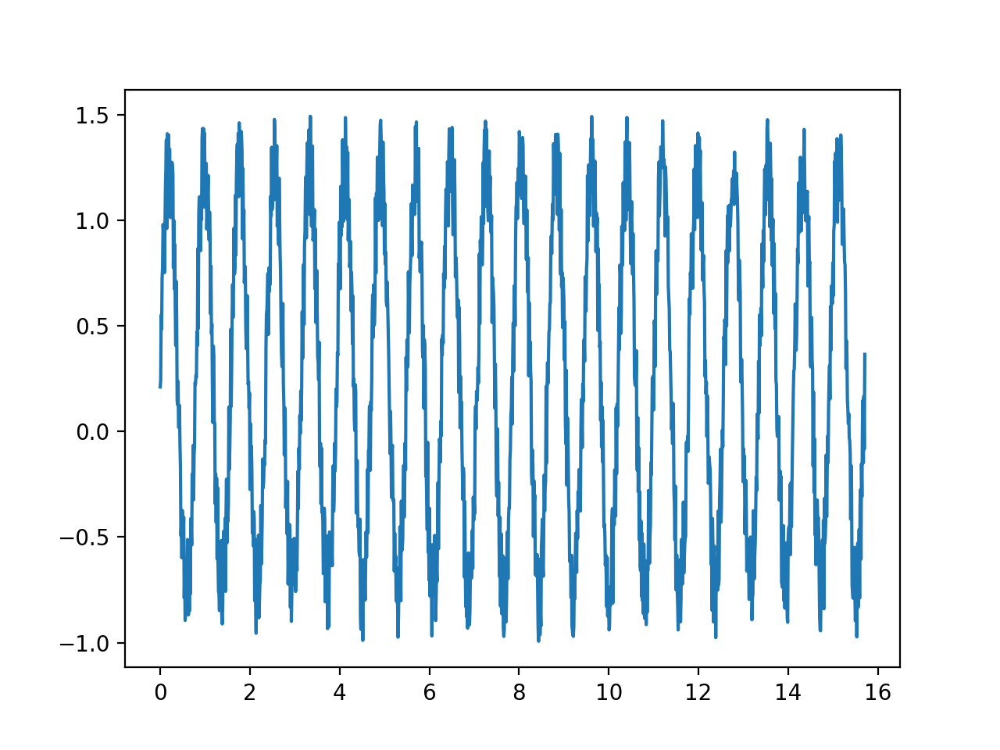

In [9]:
# create a sample signal, here a simple sin function is used.

n_samples = 1500
domain = np.linspace(0,5*np.pi,n_samples)
noise_level = 0.5
frequency = 8

signal = np.array([np.sin(frequency*x) + noise_level * np.random.random() for x in domain])

# plot 
plt.plot(domain,signal)
plt.show()

In [10]:
# take embedding of the signal, determine optimal parameters d and tao.

dimension = 30  # max tao
time_delay = 30  # max dT

embedder = SingleTakensEmbedding(parameters_type='search',dimension=dimension,time_delay=time_delay)
embedded_signal = embedder.fit_transform(signal)

print('Optimal embedding time delay based on mutual information:', embedder.time_delay_)
print('Optimal embedding dimension based on false nearest neighbors:',embedder.dimension_)
print('Shape of embedded point cloud:', embedded_signal.shape)

Optimal embedding time delay based on mutual information: 22
Optimal embedding dimension based on false nearest neighbors: 10
Shape of embedded point cloud: (1302, 10)


In [11]:
# Plot the point cloud in a 3D space using Principle Component Analysis (PCA)
pca = PCA(n_components=3)
embedded_signal = pca.fit_transform(embedded_signal)

plot_point_cloud(embedded_signal)

In [12]:
# to subsample the point cloud if needed

subsample_factor = 5
subsampled_embedded_signal = np.array([embedded_signal[subsample_factor*t,:] for t in range(int(len(embedded_signal)/subsample_factor))])
print(len(subsampled_embedded_signal))

260


<IPython.core.display.Javascript object>


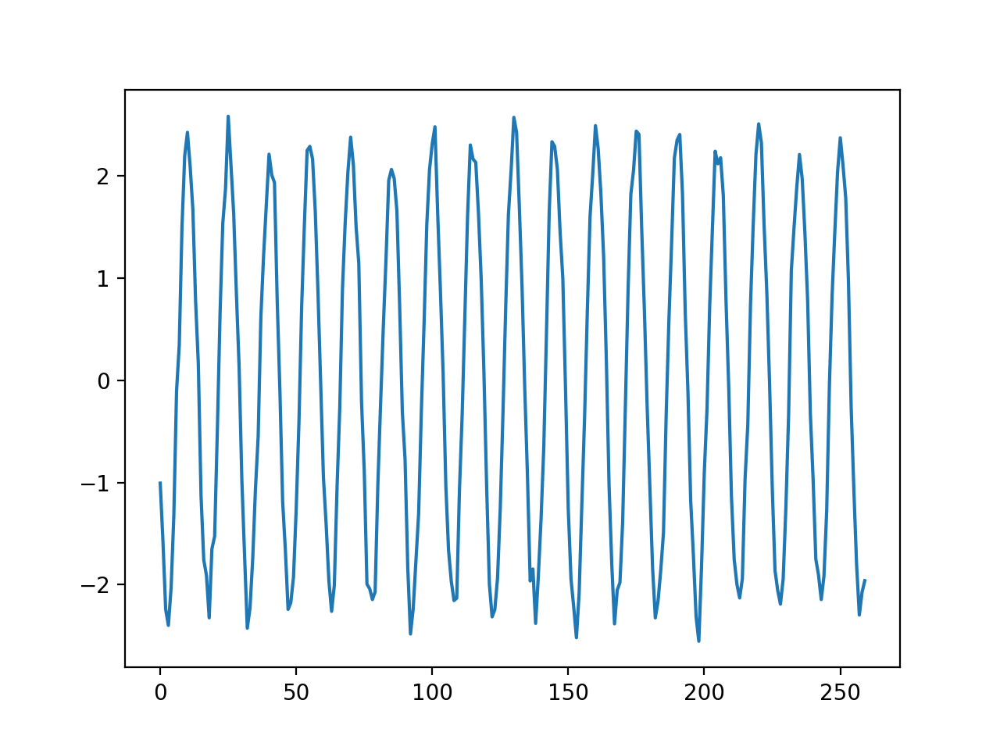

In [13]:
# projection of the point cloud on one axis
projection_coord = 0
projected_signal = subsampled_embedded_signal[:,projection_coord]
plt.plot(projected_signal)
plt.show()

<IPython.core.display.Javascript object>


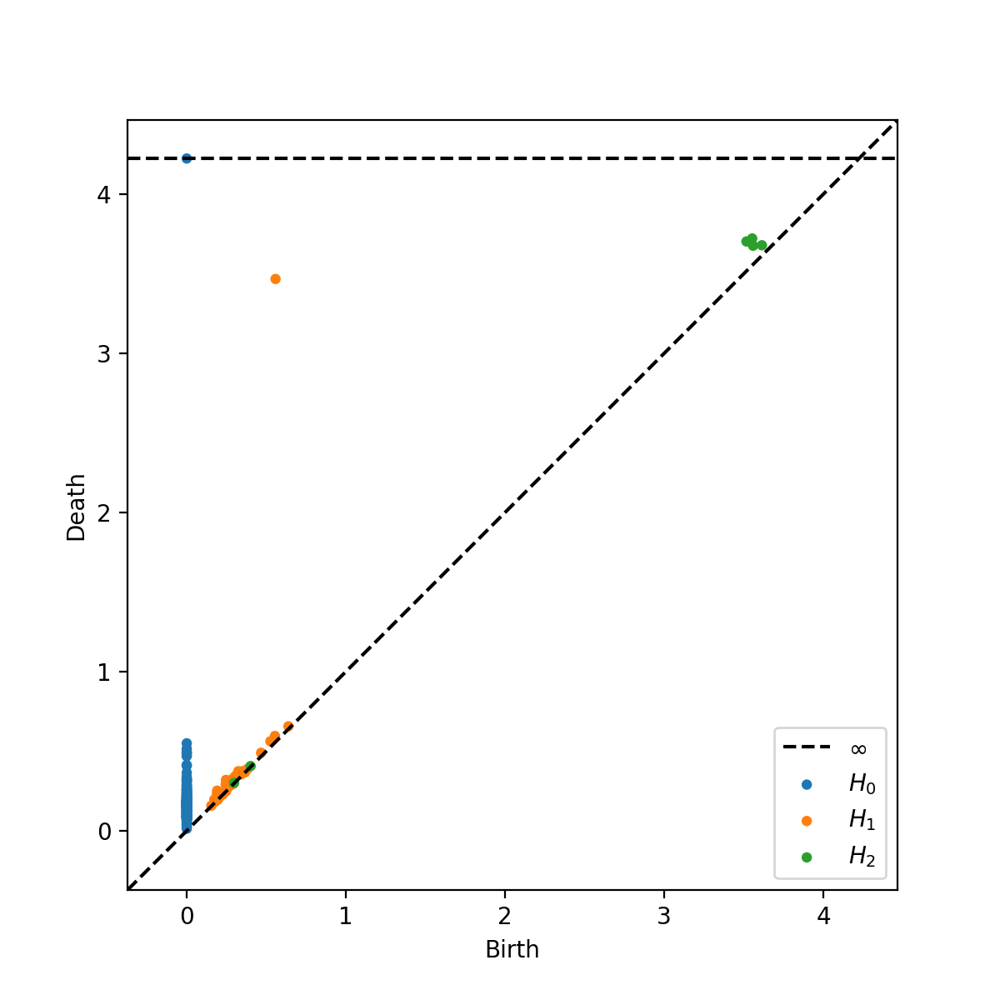

In [14]:
# Method 1: To obtain the persistent homology with a given max length (EX: H_0, H_1, H_2)

dgms = ripser(subsampled_embedded_signal, maxdim=2)['dgms']
fig = plt.figure(figsize=(6,6))
plot_diagrams(dgms, show=True)

In [15]:
# to denoise we can eliminate all the points that has distance < r to the diagonal 
# Ex) For all u $\in$ PD, eliminate u if $u_x - u_y < 0.5$.   

print(subsampled_embedded_signal)

[[-1.00696893e+00 -2.03605934e+00  1.47628719e-01]
 [-1.57289540e+00 -1.57075988e+00 -1.22242107e-01]
 [-2.24063449e+00 -7.49153429e-01  1.29491612e-01]
 [-2.39771893e+00  3.42076863e-01 -2.06071655e-01]
 [-2.02885626e+00  9.54942408e-01  1.69458715e-01]
 [-1.32450460e+00  1.81611847e+00 -6.12519781e-02]
 [-1.06298664e-01  2.08860084e+00  1.21754393e-03]
 [ 3.45407606e-01  2.20415665e+00  9.50972294e-02]
 [ 1.50187656e+00  2.01004655e+00  6.00107447e-02]
 [ 2.19581085e+00  1.17258509e+00 -1.38265832e-02]
 [ 2.42406729e+00  6.91315167e-02 -1.95861335e-01]
 [ 2.09222683e+00 -7.06904313e-01  7.94646455e-02]
 [ 1.66865887e+00 -1.61505185e+00  6.31112534e-02]
 [ 7.74447598e-01 -1.96728437e+00 -1.34172230e-01]
 [ 1.64618910e-01 -2.13319156e+00 -1.71341471e-01]
 [-1.12700843e+00 -1.95553394e+00  2.06441722e-01]
 [-1.75657185e+00 -1.50213001e+00  9.39387063e-02]
 [-1.90926827e+00 -8.62991774e-01 -2.38925432e-01]
 [-2.32381060e+00  2.04808356e-01 -1.74074020e-01]
 [-1.64945113e+00  1.15405553e+

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


<IPython.core.display.Javascript object>


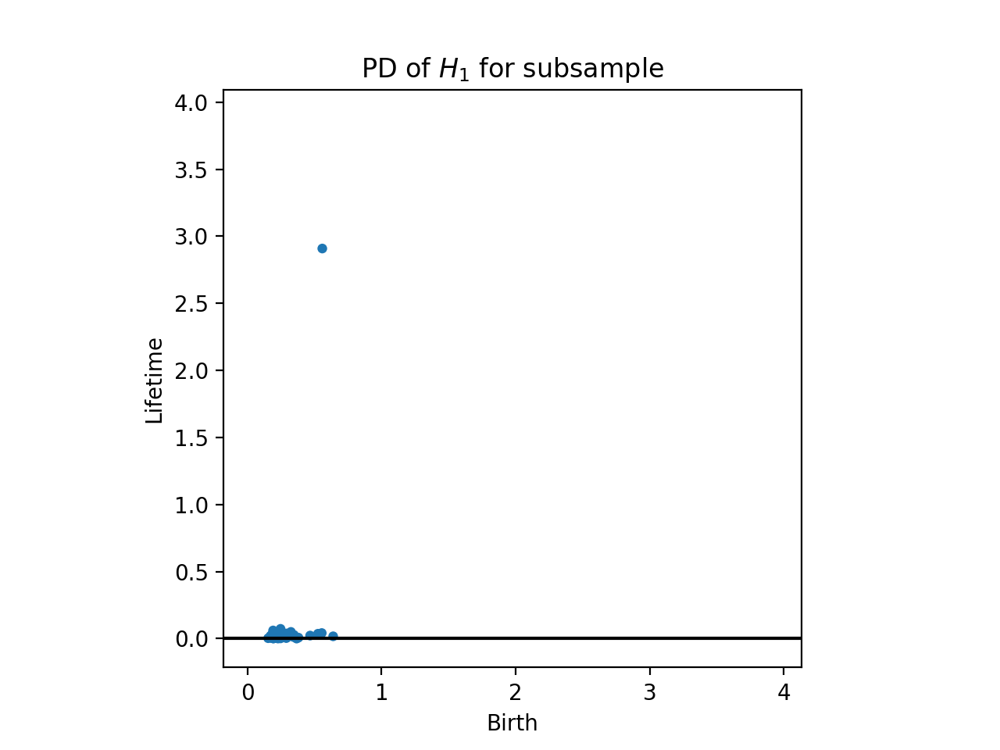

In [16]:
# Method 2: Obtain persistent homology and convert the persistent diagram from "birth-death" coordinate to "lifetime" coordinate.
rips = Rips(maxdim=1, coeff=2); 
diagrams_h1 = rips.fit_transform(subsampled_embedded_signal)[1]
rips.plot(diagrams_h1, show=False, legend=False, lifetime=True)
plt.title("PD of $H_1$ for subsample")
plt.show()

PersImage(pixels=(20, 20), spread=1, specs=None, kernel_type="gaussian", weighting_type="linear")


/var/folders/hb/n6qzb0fx2_d0mdgtq91nyh8w0000gn/T/ipykernel_20459/4187695545.py:7: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



<IPython.core.display.Javascript object>


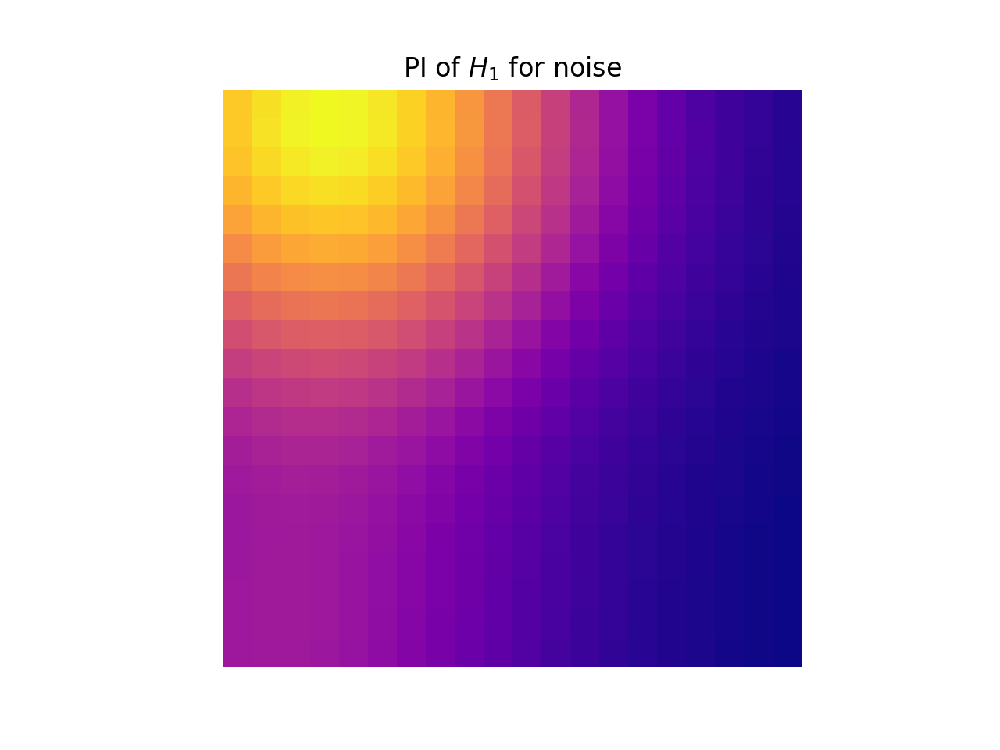

Text(0.5, 1.0, 'PI of $H_1$ for noise')

In [18]:
"""
construct PI. The program center a normalized Gaussian distribution on every point in the PD and find the persistent 
surface through the weighted sum of all distribution. Then obtain persistent image by computing the integral of that
grid. Piecewise linear weighting is used here.
"""

pim = PersImage(pixels=(20,20), spread=1)
imgs = pim.transform(diagrams_h1)
pim.show(imgs)
plt.title("PI of $H_1$ for noise")

<IPython.core.display.Javascript object>


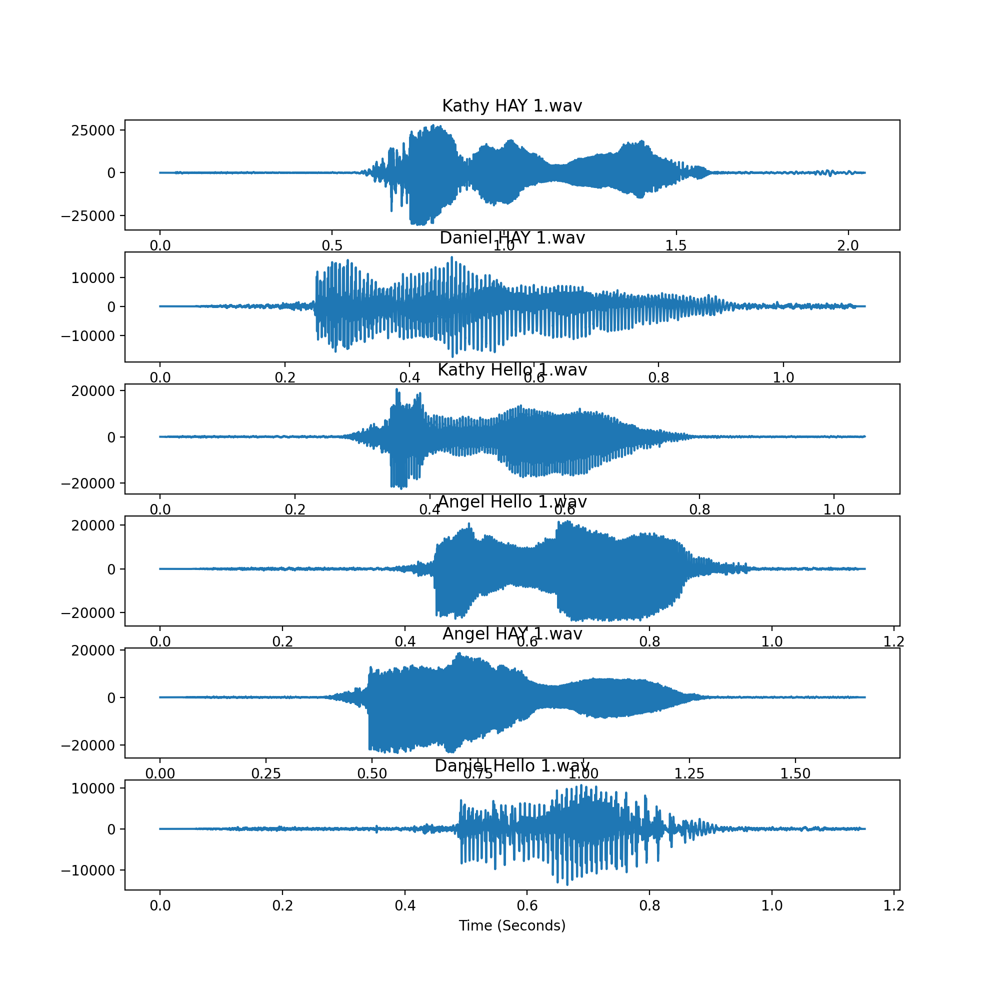

In [22]:
# Now we try to use the procedure above to compare "Hello" coming from 3 different person.
#Read in the audio file.  Fs is the sample rate, and X is the audio signal

import os
directory = 'TDA voice dataset (Test)'
audio_files = [f for f in os.listdir(directory) if f.endswith('.wav')]

# Set up the subplot grid
num_rows = len(audio_files)
num_cols = 1
fig, axs = plt.subplots(num_rows, num_cols, figsize=(10,10))

# only print the first 5 for demonstration

for i, file_name in enumerate(audio_files):
    # Read the audio file
    Fs, X = scipy.io.wavfile.read(os.path.join(directory, file_name))
    # Plot the audio file
    axs[i].plot(np.arange(len(X))/float(Fs), X)
    axs[i].set_xlabel("Time (Seconds)")
    axs[i].set_title(file_name)
    
plt.subplots_adjust()
plt.show()


<IPython.core.display.Javascript object>


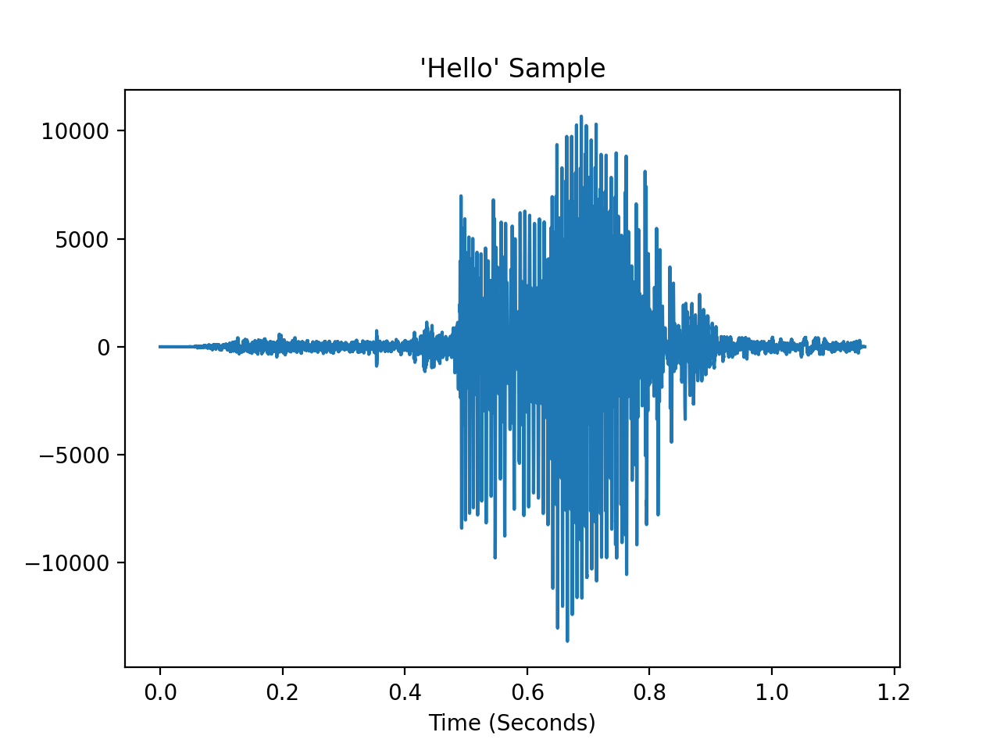

In [26]:
plt.figure()
Fs, X = scipy.io.wavfile.read("TDA voice dataset (Test)/Daniel Hello 1.wav")
plt.plot(np.arange(len(X))/float(Fs), X)
plt.xlabel("Time (Seconds)")
plt.title("'Hello' Sample")
plt.show()

In [27]:
# take embedding of the signal, use giotto package built-in function to find out how to choose optimal parameters
# d and tao.
dimension = 15
time_delay = 15

embedder = SingleTakensEmbedding(parameters_type='search',dimension=dimension,time_delay=time_delay)
embedded_signal = embedder.fit_transform(X)

print('Optimal embedding time delay based on mutual information:', embedder.time_delay_)
print('Optimal embedding dimension based on false nearest neighbors:',embedder.dimension_)
# print('Shape of embedded point cloud:', embedded_signal.shape)
# print(embedded_signal)

Optimal embedding time delay based on mutual information: 15
Optimal embedding dimension based on false nearest neighbors: 15


In [28]:
%%time

pca = PCA(n_components=3)
embedded_signal = pca.fit_transform(embedded_signal)
plot_point_cloud(embedded_signal)

CPU times: user 1.44 s, sys: 268 ms, total: 1.71 s
Wall time: 670 ms


In [29]:
print(len(embedded_signal))

55086


In [30]:
# to subsample the point cloud if needed

subsample_factor =8
subsampled_embedded_signal = np.array([embedded_signal[subsample_factor*t,:] for t in range(int(len(embedded_signal)/subsample_factor))])
print(len(subsampled_embedded_signal))

6885


<IPython.core.display.Javascript object>


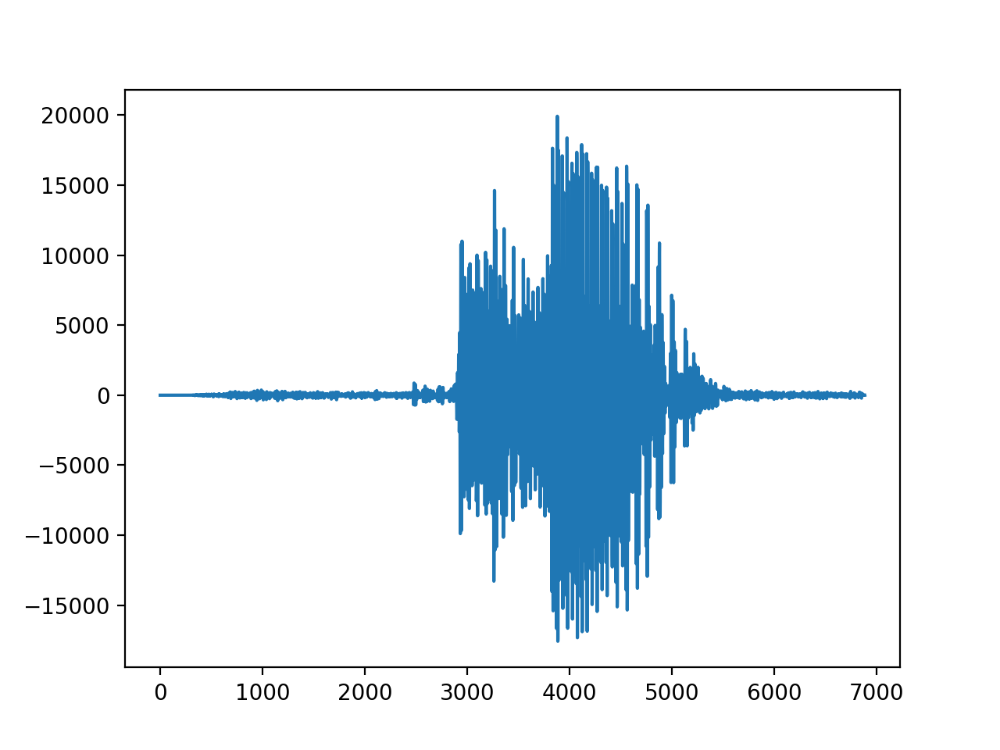

In [31]:
projection_coord = 0
projected_signal = subsampled_embedded_signal[:,projection_coord]
plt.plot(projected_signal)
plt.show()

<IPython.core.display.Javascript object>


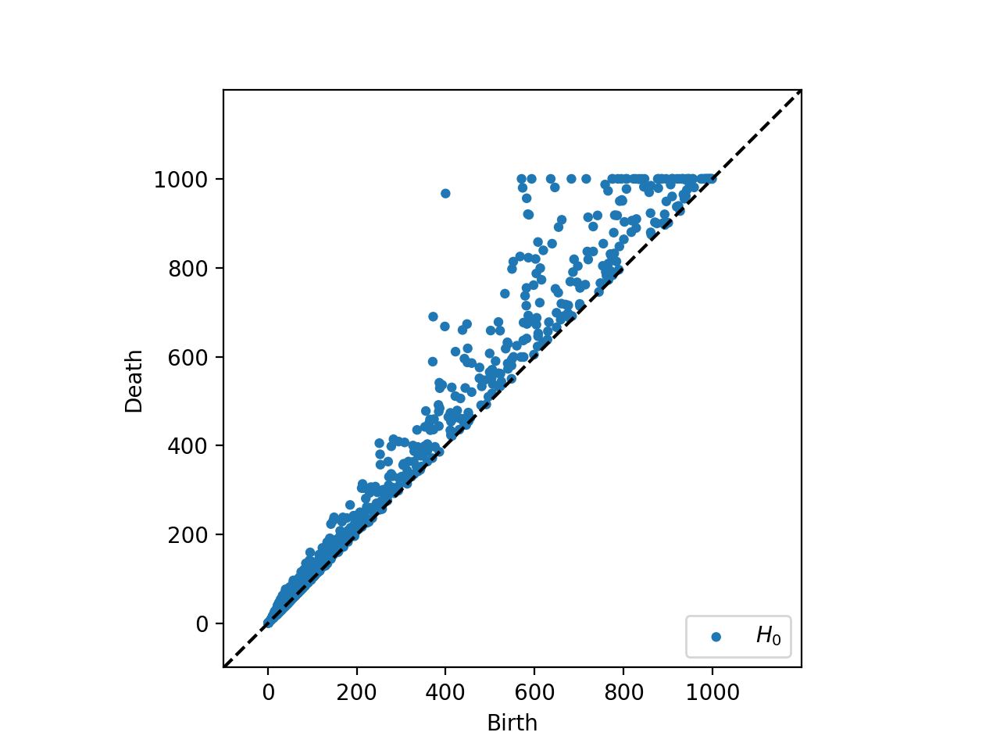

In [32]:
# Demonstation of a simple version to shorten the computation time.

homology_dimensions = [1]
VR = VietorisRipsPersistence(
    metric='euclidean', max_edge_length=1000, homology_dimensions=homology_dimensions)

Y_diagrams = VR.fit_transform(subsampled_embedded_signal[None, :, :])
plot_diagrams(Y_diagrams[0])

In [33]:
# This prints the distance matrix to the diagonal line

with np.printoptions(threshold=np.inf):
    print(Y_diagrams)


[[[9.58929138e+02 9.80751099e+02 1.00000000e+00]
  [9.48896545e+02 9.87261902e+02 1.00000000e+00]
  [9.42504639e+02 9.75065979e+02 1.00000000e+00]
  [9.40234009e+02 9.61305664e+02 1.00000000e+00]
  [9.39451599e+02 9.98092285e+02 1.00000000e+00]
  [9.37017212e+02 9.55303528e+02 1.00000000e+00]
  [9.34738403e+02 9.64898987e+02 1.00000000e+00]
  [9.27409302e+02 9.27657166e+02 1.00000000e+00]
  [9.23681335e+02 9.39125732e+02 1.00000000e+00]
  [9.19807190e+02 9.37261414e+02 1.00000000e+00]
  [9.09447693e+02 9.60430054e+02 1.00000000e+00]
  [9.06079041e+02 9.87064148e+02 1.00000000e+00]
  [9.00736145e+02 9.01217651e+02 1.00000000e+00]
  [8.96321350e+02 9.49262756e+02 1.00000000e+00]
  [8.93144775e+02 8.96369019e+02 1.00000000e+00]
  [8.92588562e+02 9.20202881e+02 1.00000000e+00]
  [8.89142883e+02 9.00531860e+02 1.00000000e+00]
  [8.78330994e+02 9.79092407e+02 1.00000000e+00]
  [8.75264771e+02 8.99735718e+02 1.00000000e+00]
  [8.70662354e+02 9.02353027e+02 1.00000000e+00]
  [8.62569763e+02 8.

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


<IPython.core.display.Javascript object>


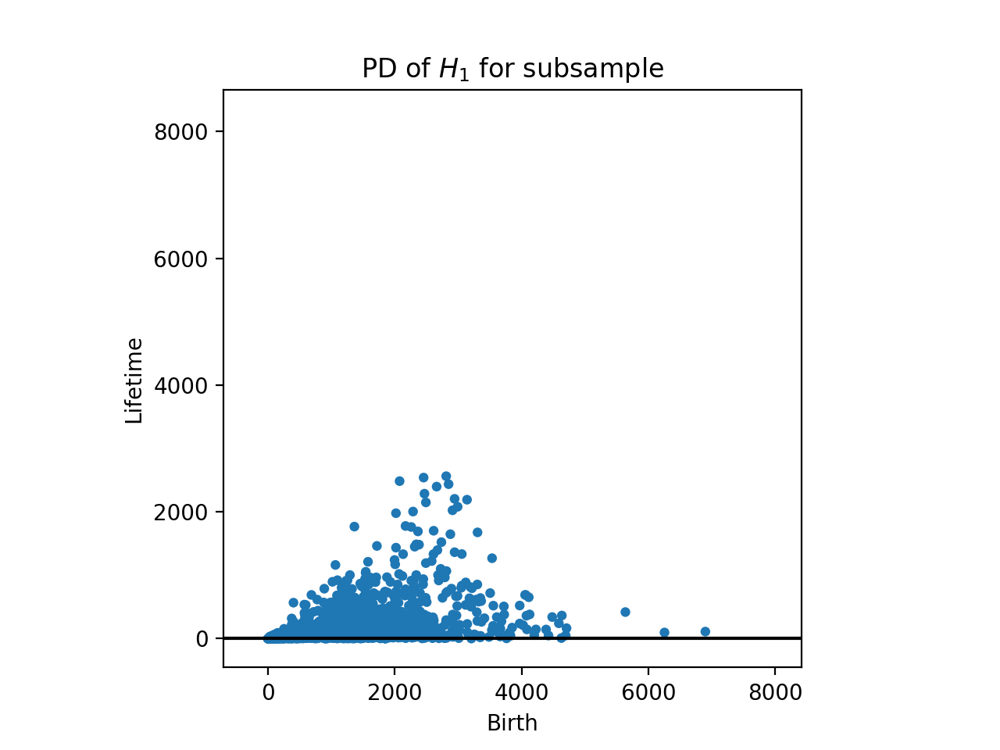

In [34]:
# Demonstration of the method that will be used in this project.
rips = Rips(maxdim=1, coeff=2); 
diagrams_h1 = rips.fit_transform(subsampled_embedded_signal)[1]
rips.plot(diagrams_h1, show=False, legend=False, lifetime=True)
plt.title("PD of $H_1$ for subsample")
plt.show()

/var/folders/hb/n6qzb0fx2_d0mdgtq91nyh8w0000gn/T/ipykernel_20459/297045527.py:3: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(20, 20), spread=1, specs=None, kernel_type="gaussian", weighting_type="linear")
[[0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000 0.000000

<IPython.core.display.Javascript object>


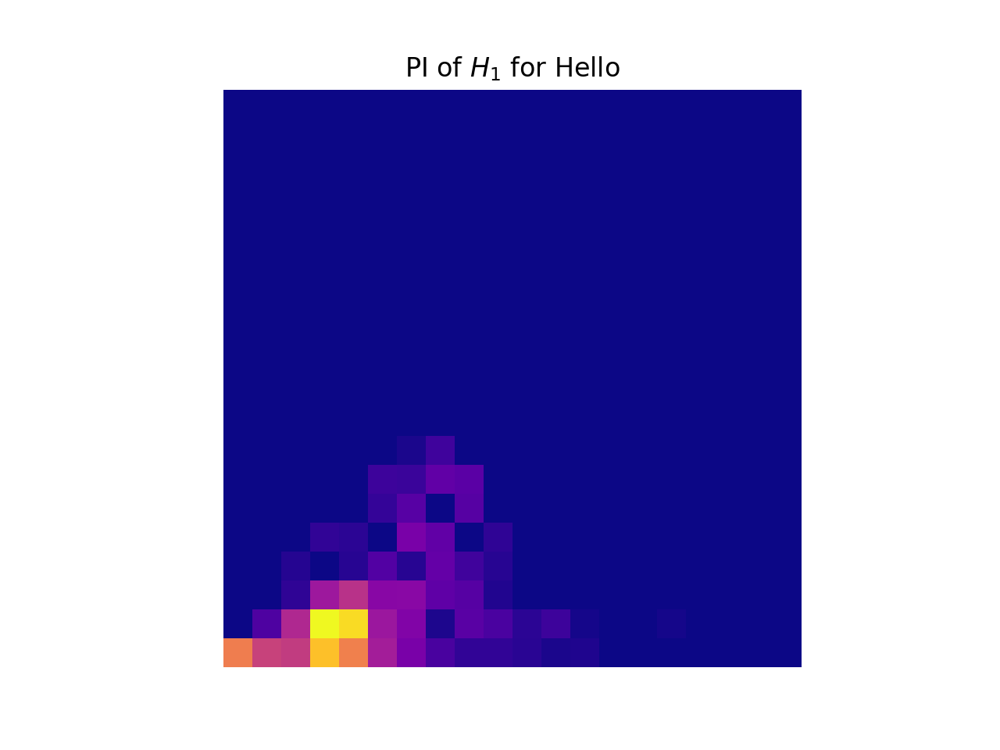

Text(0.5, 1.0, 'PI of $H_1$ for Hello')

In [35]:
# Show PI

pim = PersImage(pixels=(20,20), spread=1)
imgs = pim.transform(diagrams_h1)
print(imgs) ## the vector
pim.show(imgs)
plt.title("PI of $H_1$ for Hello")

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


/var/folders/hb/n6qzb0fx2_d0mdgtq91nyh8w0000gn/T/ipykernel_20459/506660250.py:22: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(20, 20), spread=1, specs=None, kernel_type="gaussian", weighting_type="linear")


<IPython.core.display.Javascript object>


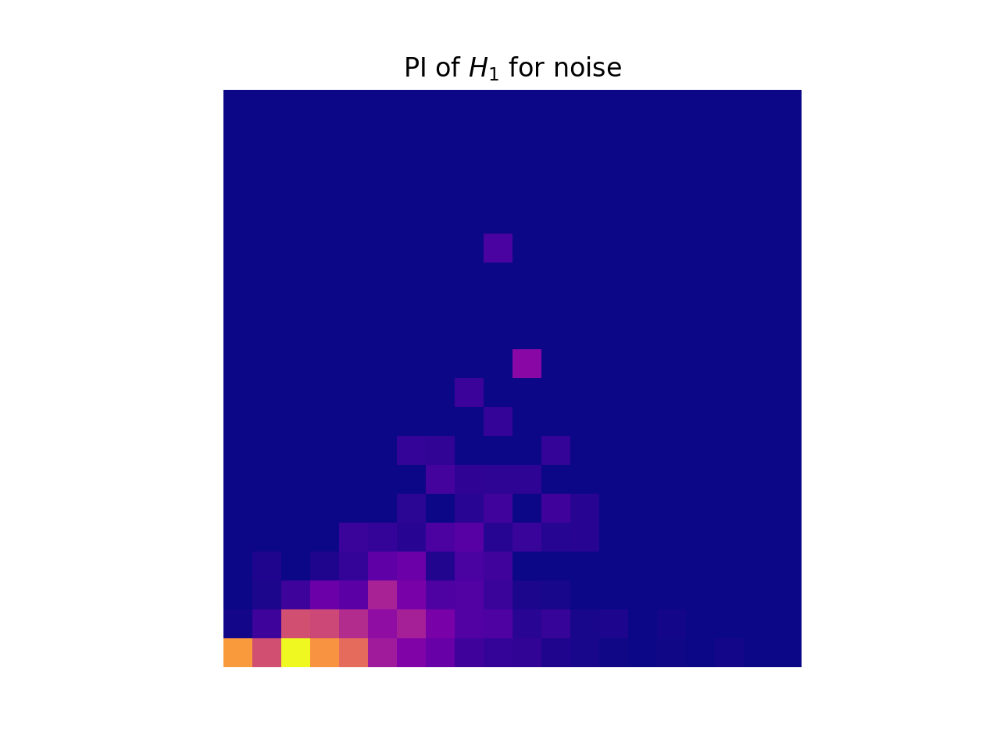

Text(0.5, 1.0, 'PI of $H_1$ for noise')

In [36]:
"""
Here displays a cell combining the all the steps to convert a signal from its original state to a PI.
"""

#read
Fs, X = scipy.io.wavfile.read("TDA Voice Dataset (Test)/Daniel HAY 1.wav")
# optimal tao and dT
dimension = 15  
time_delay = 15
embedder = SingleTakensEmbedding(parameters_type='search',dimension=dimension,time_delay=time_delay)
embedded_signal = embedder.fit_transform(X)
# reduce dimension to 3
pca = PCA(n_components=3)
embedded_signal = pca.fit_transform(embedded_signal)
# subsample the point cloud
subsample_factor = 8
subsampled_embedded_signal = np.array([embedded_signal[subsample_factor*t,:] for t in range(int(len(embedded_signal)/subsample_factor))])
# lifetime PD
rips = Rips(maxdim=1, coeff=2); 
diagrams_h1 = rips.fit_transform(subsampled_embedded_signal)[1]
# construct PI
pim = PersImage(pixels=(20,20), spread=1)
imgs = pim.transform(diagrams_h1)
pim.show(imgs)
plt.title("PI of $H_1$ for noise")


/var/folders/hb/n6qzb0fx2_d0mdgtq91nyh8w0000gn/T/ipykernel_1762/1516037057.py:2: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(20, 20), spread=1, specs=None, kernel_type="gaussian", weighting_type="linear")


<IPython.core.display.Javascript object>


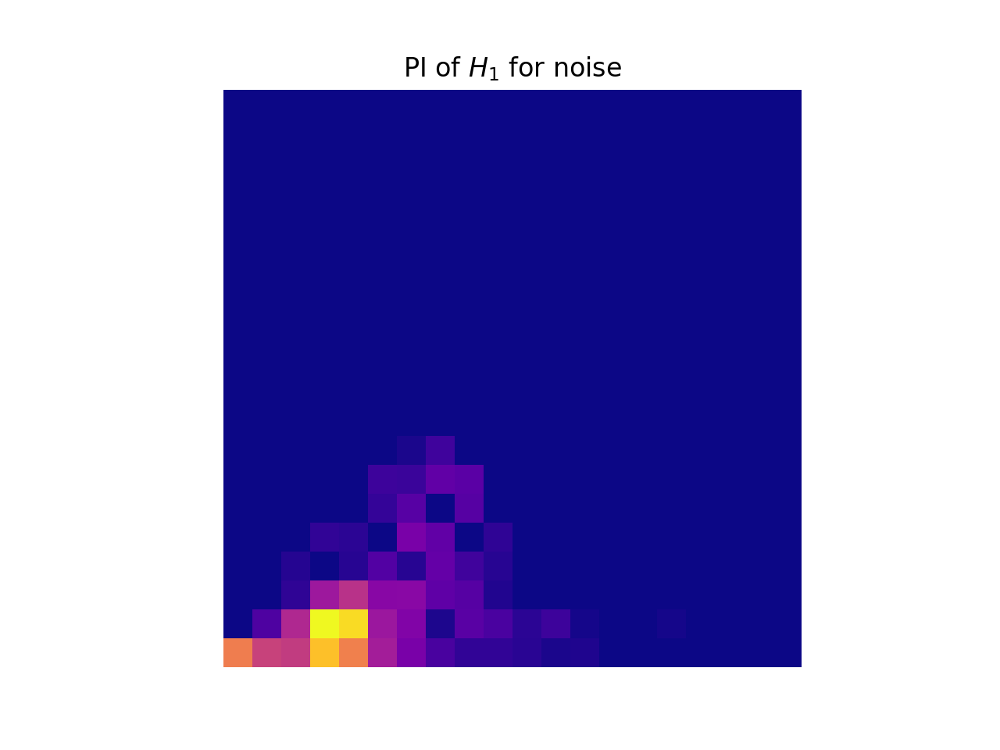

Text(0.5, 1.0, 'PI of $H_1$ for noise')

In [58]:
# Show PI
pim = PersImage(pixels=(20,20), spread=1)
imgs = pim.transform(diagrams_h1)
pim.show(imgs)
plt.title("PI of D1 $H_1$ for noise")